![](https://raw.githubusercontent.com/FrankFeng-23/SPREAD/master/images/sample_images_compressed-min.png)

## Train custom instance segmentation model using Detectron2 on the SPREAD dataset

##### https://github.com/FrankFeng-23/SPREAD
##### https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4977986
##### https://zenodo.org/records/14515915

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)
if torch.cuda.is_available:
    devices       = [d for d in range(torch.cuda.device_count())]
    device_names  = [torch.cuda.get_device_name(d) for d in devices]
    print(f'{device_names}')
else:
    print('WARNING: CUDA not available!')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Fri_Jan__6_16:45:21_PST_2023
Cuda compilation tools, release 12.0, V12.0.140
Build cuda_12.0.r12.0/compiler.32267302_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6
['NVIDIA RTX A6000']


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#### Replacement for Colab `cv2_imshow()` found here: https://gist.github.com/lalanikarim/df44bac00918ce8efdfc438c2d73592d

In [3]:
import numpy as np 
import cv2
# comment the original import from google.colab.patch
# from google.colab.patches import cv2_imshow 

# import pytplot from matplotlib if not already imported
import matplotlib.pyplot as plt

# for inline plot rendering
%matplotlib inline

def cv2_imshow(img):
    # set appropriate figure size in case it is too small or too large. Don't worry about it being square.
    plt.figure(figsize=(10,10))
    try:
        # try simple BGR 2 RGB conversion so pyplot can show the image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    except:
        # this is for a special case in case the above doesn't work after applying convolutions
        plt.imshow(cv2.cvtColor(np.uint8(np.absolute(img)), cv2.COLOR_BGR2RGB))
    plt.show()

The default models are trained on the COCO dataset (generic natural images) so let us go ahead and load a generic image to see if detectron is working. **We will run a pre-trained model on this image.**

--2025-01-13 21:21:25--  https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.240.155
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.240.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564946 (2.4M) [image/jpeg]
Saving to: ‘/tmp/kitchen.jpg’

/tmp/kitchen.jpg    100%[===================>]   2.45M  10.4MB/s    in 0.2s    

2025-01-13 21:21:25 (10.4 MB/s) - ‘/tmp/kitchen.jpg’ saved [2564946/2564946]



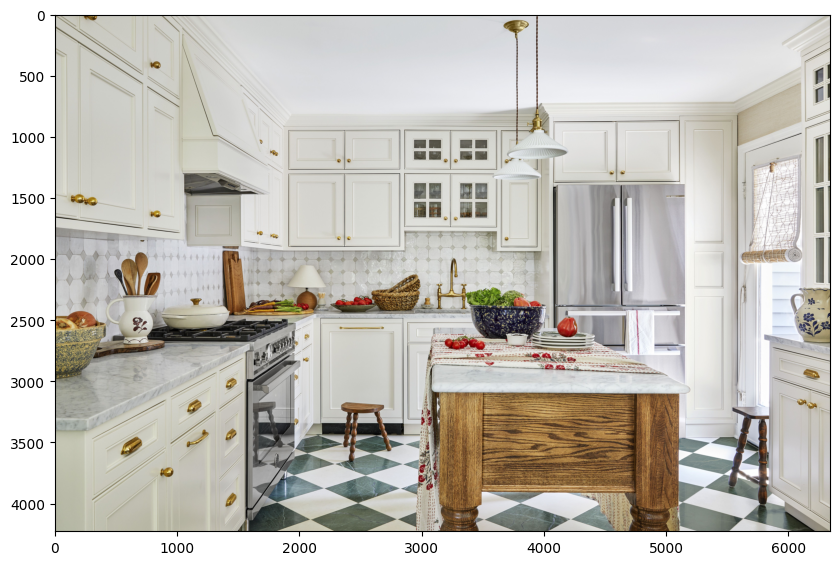

In [4]:
fn = "/tmp/kitchen.jpg"
!wget --user-agent='Mozilla 5.0' 'https://hips.hearstapps.com/hmg-prod/images/white-kitchen-tile-floor-663e73179c3c4.jpg' --output-document={fn}
kitchen = cv2.imread(fn)
cv2_imshow(kitchen)

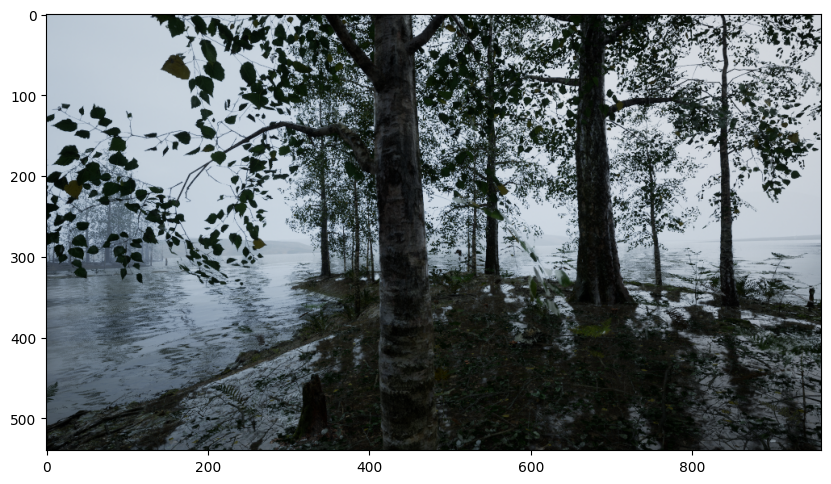

In [5]:
fn   = '/mnt/raid1/dataset/spread/spread-v2/birch-forest/rgb/Tree10011_1720527021.png'
tree = cv2.imread(fn)
cv2_imshow(tree)

#### Create a detectron2 config and a detectron2 DefaultPredictor to run inference on the images

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(kitchen)

[01/13 21:21:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([44, 69, 56, 44, 44, 45, 60, 56, 45, 75, 45, 72, 41, 44, 47, 45, 58, 45,
        47, 72, 47, 46, 45], device='cuda:0')
Boxes(tensor([[6.5815e+02, 1.9479e+03, 7.6059e+02, 2.2956e+03],
        [7.9914e+02, 2.4244e+03, 1.9963e+03, 3.9455e+03],
        [2.3403e+03, 3.1646e+03, 2.7578e+03, 3.6395e+03],
        [4.8495e+02, 2.0909e+03, 5.8961e+02, 2.3047e+03],
        [5.4653e+02, 2.0054e+03, 6.7607e+02, 2.3027e+03],
        [5.5457e-01, 2.4994e+03, 4.1767e+02, 2.9753e+03],
        [2.9884e+03, 2.6632e+03, 5.1691e+03, 4.1879e+03],
        [5.5037e+03, 3.1771e+03, 5.8511e+03, 4.0149e+03],
        [2.2754e+03, 2.3646e+03, 2.6382e+03, 2.4396e+03],
        [6.0042e+03, 2.2164e+03, 6.3410e+03, 2.6818e+03],
        [3.3910e+03, 2.3489e+03, 4.0171e+03, 2.6853e+03],
        [4.1557e+03, 1.3937e+03, 5.1730e+03, 3.6036e+03],
        [4.2928e+02, 2.3030e+03, 8.3838e+02, 2.6952e+03],
        [7.2964e+02, 2.1157e+03, 8.5757e+02, 2.2967e+03],
        [1.9744e+03, 2.2680e+03, 2.1491e+03, 2.4199e+03]

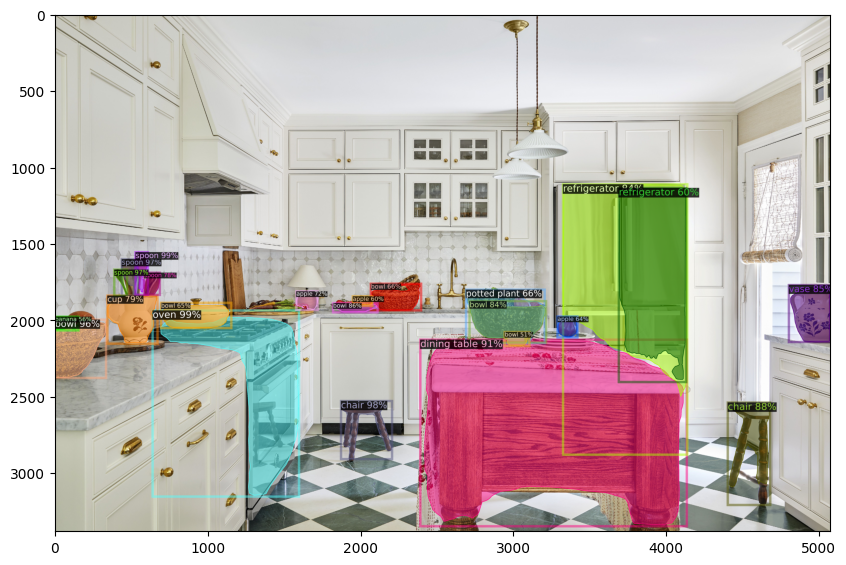

In [8]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(kitchen[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

#### Now that we know the model is working on a generic image, let's test the same model on one image from the SPREAD dataset...

Unfortunately the model __mask_rcnn_R_50_FPN_3x__ [has not been trained on trees](https://gist.github.com/AruniRC/7b3dadd004da04c80198557db5da4bda), so we can't expect great results.

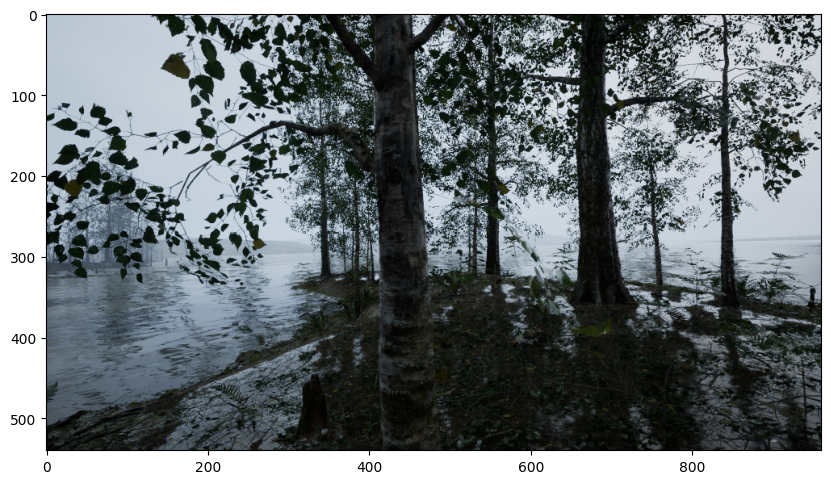

In [9]:
sci_outputs = predictor(tree)
sci_v = Visualizer(tree[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
cv2_imshow(sci_out.get_image()[:, :, ::-1])

No detection at all. Now let's try to fine-tune one of the pretrained models with the SPREAD dataset...

# Train on a custom dataset

Import the necessary function to register datasets in the COCO format. We'll register both the training, validation and test sets. Please note that we are working with training and validation data that is already in the COCO format and that has been merged in a single JSON file (per each set) that describes all the annotations, including segmentation, from all the training images.

In [10]:
from detectron2.data.datasets import register_coco_instances
spread_dir = '/mnt/raid1/dataset/spread/spread-v2'
register_coco_instances("spread_train", {}, f"{spread_dir}/train.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_valid", {}, f"{spread_dir}/valid.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_test" , {}, f"{spread_dir}/test.json" , "/mnt/raid1/dataset/spread/spread-v2-coco")

Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [11]:
train_metadata      = MetadataCatalog.get("spread_train")
train_dataset_dicts = DatasetCatalog.get ("spread_train")

[01/13 21:21:46 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 14.81 seconds.
[01/13 21:21:46 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json


In [12]:
val_metadata        = MetadataCatalog.get("spread_valid")
val_dataset_dicts   = DatasetCatalog.get ("spread_valid")

[01/13 21:21:52 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 5.41 seconds.
[01/13 21:21:52 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json


In [13]:
test_metadata        = MetadataCatalog.get("spread_test")
test_dataset_dicts   = DatasetCatalog.get ("spread_test")

[01/13 21:21:58 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 3.03 seconds.
[01/13 21:21:58 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json


In [14]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (18,10)

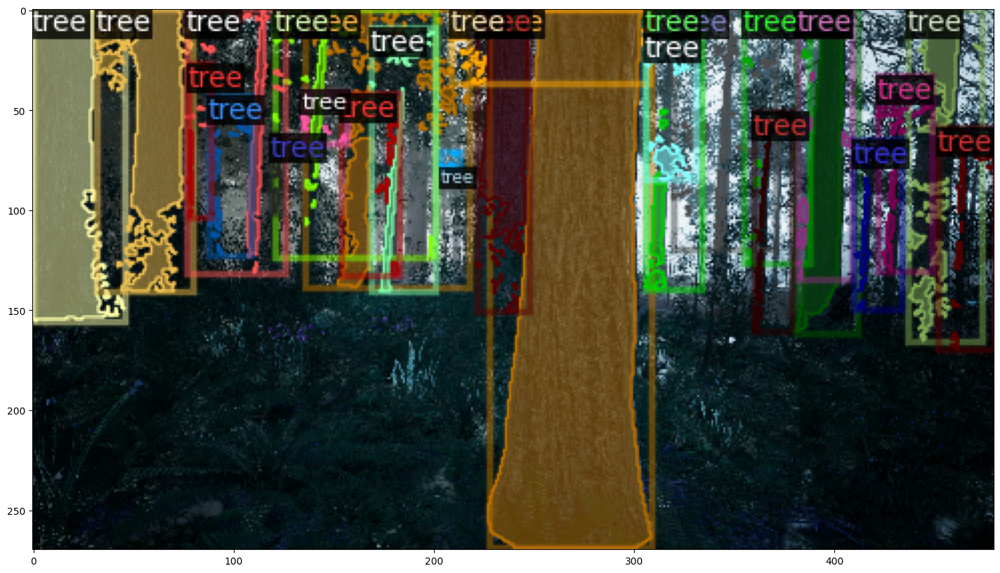

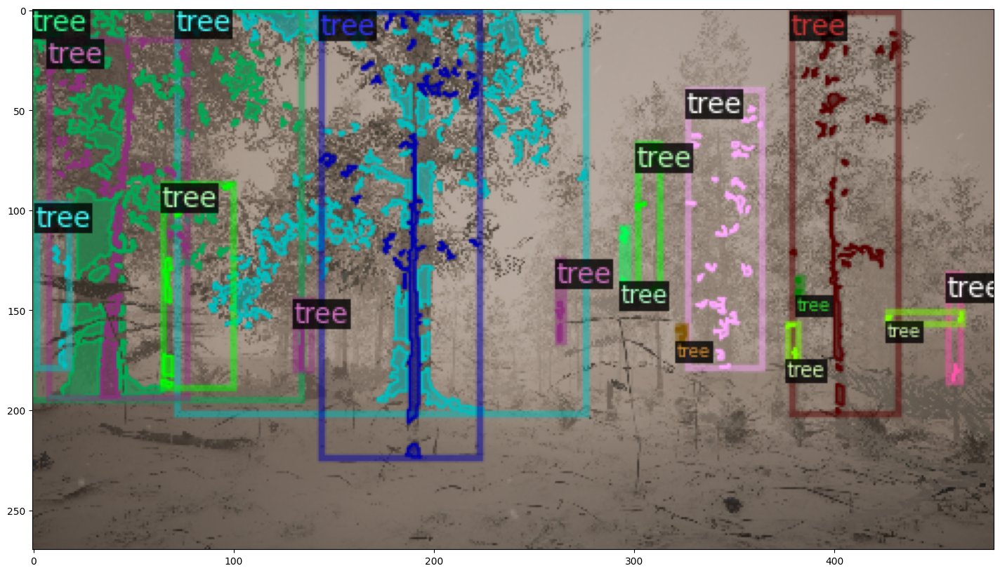

In [15]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show(18,10)

# Train

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [16]:
from detectron2.engine import DefaultTrainer

model_name = 'mask_rcnn_R_101_DC5_3x'

cfg = get_cfg()
cfg.OUTPUT_DIR      = "/mnt/raid1/repos/maskdino/maskdino-output/" + model_name
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-InstanceSegmentation/{model_name}.yaml"))
cfg.DATASETS.TRAIN  = ("spread_train",)
cfg.DATASETS.TEST   = ("spread_valid")
cfg.DATALOADER.NUM_WORKERS = 32
cfg.MODEL.WEIGHTS   = model_zoo.get_checkpoint_url(f"COCO-InstanceSegmentation/{model_name}.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 32  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR  = 0.0005   # pick a good LR
cfg.SOLVER.MAX_ITER = 10000    # 1000 iterations = 1.5 hours on RTX A6000
cfg.SOLVER.STEPS    = []       # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # We have 1 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

cfg.SOLVER.CHECKPOINT_PERIOD    = 500
cfg.SOLVER.REFERENCE_WORLD_SIZE = 2 # for dataparallel hopefully (nope, it doesn't work)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

[01/13 21:22:00 d2.engine.defaults]: Auto-scaling the config to batch_size=16, learning_rate=0.00025, max_iter=20000, warmup=2000.
[01/13 21:22:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(


[01/13 21:22:19 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 17.64 seconds.
[01/13 21:22:19 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json
[01/13 21:22:19 d2.data.build]: Removed 0 images with no usable annotations. 8356 images left.
[01/13 21:22:19 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 291274       |
|            |              |
[01/13 21:22:19 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/13 21:22:19 d2.data.build]: Using training sampler TrainingSampler
[01/13 21:22:19 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/13 21:22:19 d2.data.common]: Serializing 8356 elements t

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

In [17]:
_please_stop_here_with_an_error_

NameError: name '_please_stop_here_with_an_error_' is not defined

### Launch the training

In [18]:
trainer.train() #Start the training process

[01/13 21:22:32 d2.engine.train_loop]: Starting training from iteration 0
[01/13 21:23:15 d2.utils.events]:  eta: 10:02:37  iter: 19  total_loss: 7.213  loss_cls: 0.6918  loss_box_reg: 0.2815  loss_mask: 0.6969  loss_rpn_cls: 5.075  loss_rpn_loc: 0.4815    time: 1.8088  last_time: 1.8117  data_time: 0.3689  last_data_time: 0.0343   lr: 2.6226e-06  max_mem: 25871M
[01/13 21:23:53 d2.utils.events]:  eta: 10:08:17  iter: 39  total_loss: 6.535  loss_cls: 0.6655  loss_box_reg: 0.3794  loss_mask: 0.6882  loss_rpn_cls: 4.321  loss_rpn_loc: 0.4739    time: 1.8400  last_time: 1.8705  data_time: 0.0274  last_data_time: 0.0206   lr: 5.1201e-06  max_mem: 26345M
[01/13 21:24:32 d2.utils.events]:  eta: 10:21:52  iter: 59  total_loss: 5.482  loss_cls: 0.6337  loss_box_reg: 0.5707  loss_mask: 0.6707  loss_rpn_cls: 3.177  loss_rpn_loc: 0.4478    time: 1.8866  last_time: 1.9972  data_time: 0.0273  last_data_time: 0.0300   lr: 7.6176e-06  max_mem: 27434M
[01/13 21:25:13 d2.utils.events]:  eta: 10:37:26  

[01/13 21:42:17 d2.utils.events]:  eta: 11:28:06  iter: 559  total_loss: 2.186  loss_cls: 0.4161  loss_box_reg: 0.8212  loss_mask: 0.3755  loss_rpn_cls: 0.2243  loss_rpn_loc: 0.3405    time: 2.1031  last_time: 2.1853  data_time: 0.0278  last_data_time: 0.0099   lr: 7.0055e-05  max_mem: 27609M
[01/13 21:43:02 d2.utils.events]:  eta: 11:27:07  iter: 579  total_loss: 2.205  loss_cls: 0.4194  loss_box_reg: 0.8141  loss_mask: 0.3942  loss_rpn_cls: 0.2251  loss_rpn_loc: 0.3521    time: 2.1083  last_time: 2.1576  data_time: 0.0290  last_data_time: 0.0369   lr: 7.2553e-05  max_mem: 27609M
[01/13 21:43:44 d2.utils.events]:  eta: 11:26:15  iter: 599  total_loss: 2.197  loss_cls: 0.4198  loss_box_reg: 0.8203  loss_mask: 0.3943  loss_rpn_cls: 0.218  loss_rpn_loc: 0.3464    time: 2.1085  last_time: 2.1056  data_time: 0.0310  last_data_time: 0.0092   lr: 7.505e-05  max_mem: 27609M
[01/13 21:44:27 d2.utils.events]:  eta: 11:25:43  iter: 619  total_loss: 2.147  loss_cls: 0.41  loss_box_reg: 0.8166  lo

[01/13 22:02:25 d2.utils.events]:  eta: 11:10:41  iter: 1119  total_loss: 1.942  loss_cls: 0.3823  loss_box_reg: 0.7522  loss_mask: 0.3222  loss_rpn_cls: 0.1796  loss_rpn_loc: 0.3255    time: 2.1208  last_time: 2.1740  data_time: 0.0308  last_data_time: 0.0214   lr: 0.00013999  max_mem: 27609M
[01/13 22:03:07 d2.utils.events]:  eta: 11:10:02  iter: 1139  total_loss: 1.994  loss_cls: 0.3913  loss_box_reg: 0.7594  loss_mask: 0.335  loss_rpn_cls: 0.1884  loss_rpn_loc: 0.3331    time: 2.1209  last_time: 2.1284  data_time: 0.0309  last_data_time: 0.0096   lr: 0.00014248  max_mem: 27609M
[01/13 22:03:50 d2.utils.events]:  eta: 11:09:26  iter: 1159  total_loss: 2.013  loss_cls: 0.3978  loss_box_reg: 0.7642  loss_mask: 0.3347  loss_rpn_cls: 0.1937  loss_rpn_loc: 0.3276    time: 2.1212  last_time: 2.1780  data_time: 0.0309  last_data_time: 0.0258   lr: 0.00014498  max_mem: 27609M
[01/13 22:04:32 d2.utils.events]:  eta: 11:08:44  iter: 1179  total_loss: 1.997  loss_cls: 0.398  loss_box_reg: 0.76

[01/13 22:21:37 d2.utils.events]:  eta: 10:50:01  iter: 1659  total_loss: 1.896  loss_cls: 0.3769  loss_box_reg: 0.7363  loss_mask: 0.3128  loss_rpn_cls: 0.1761  loss_rpn_loc: 0.3138    time: 2.1246  last_time: 2.0735  data_time: 0.0342  last_data_time: 0.0528   lr: 0.00020742  max_mem: 27609M
[01/13 22:22:20 d2.utils.events]:  eta: 10:49:22  iter: 1679  total_loss: 1.835  loss_cls: 0.3618  loss_box_reg: 0.7108  loss_mask: 0.305  loss_rpn_cls: 0.1705  loss_rpn_loc: 0.2983    time: 2.1248  last_time: 2.2592  data_time: 0.0285  last_data_time: 0.0263   lr: 0.00020992  max_mem: 27609M
[01/13 22:23:03 d2.utils.events]:  eta: 10:48:41  iter: 1699  total_loss: 1.905  loss_cls: 0.3763  loss_box_reg: 0.7157  loss_mask: 0.3197  loss_rpn_cls: 0.1814  loss_rpn_loc: 0.3193    time: 2.1248  last_time: 2.1929  data_time: 0.0295  last_data_time: 0.0330   lr: 0.00021241  max_mem: 27609M
[01/13 22:23:45 d2.utils.events]:  eta: 10:48:01  iter: 1719  total_loss: 1.906  loss_cls: 0.3692  loss_box_reg: 0.7

[01/13 22:41:36 d2.utils.events]:  eta: 10:29:57  iter: 2219  total_loss: 1.853  loss_cls: 0.359  loss_box_reg: 0.7129  loss_mask: 0.3063  loss_rpn_cls: 0.1729  loss_rpn_loc: 0.3003    time: 2.1266  last_time: 2.1148  data_time: 0.0303  last_data_time: 0.0290   lr: 0.00025  max_mem: 27609M
[01/13 22:42:19 d2.utils.events]:  eta: 10:29:14  iter: 2239  total_loss: 1.863  loss_cls: 0.3639  loss_box_reg: 0.7071  loss_mask: 0.3056  loss_rpn_cls: 0.1762  loss_rpn_loc: 0.322    time: 2.1265  last_time: 2.1349  data_time: 0.0298  last_data_time: 0.0315   lr: 0.00025  max_mem: 27609M
[01/13 22:43:01 d2.utils.events]:  eta: 10:28:43  iter: 2259  total_loss: 1.879  loss_cls: 0.367  loss_box_reg: 0.7095  loss_mask: 0.3062  loss_rpn_cls: 0.1754  loss_rpn_loc: 0.3221    time: 2.1265  last_time: 2.1764  data_time: 0.0288  last_data_time: 0.0327   lr: 0.00025  max_mem: 27609M
[01/13 22:43:43 d2.utils.events]:  eta: 10:27:55  iter: 2279  total_loss: 1.889  loss_cls: 0.3731  loss_box_reg: 0.7195  loss_m

[01/13 23:01:28 d2.utils.events]:  eta: 10:08:43  iter: 2779  total_loss: 1.842  loss_cls: 0.3523  loss_box_reg: 0.7021  loss_mask: 0.3063  loss_rpn_cls: 0.1664  loss_rpn_loc: 0.3127    time: 2.1266  last_time: 2.0983  data_time: 0.0301  last_data_time: 0.0370   lr: 0.00025  max_mem: 27609M
[01/13 23:02:11 d2.utils.events]:  eta: 10:08:04  iter: 2799  total_loss: 1.78  loss_cls: 0.3476  loss_box_reg: 0.697  loss_mask: 0.3021  loss_rpn_cls: 0.1599  loss_rpn_loc: 0.2975    time: 2.1267  last_time: 2.1275  data_time: 0.0304  last_data_time: 0.0343   lr: 0.00025  max_mem: 27609M
[01/13 23:02:53 d2.utils.events]:  eta: 10:07:18  iter: 2819  total_loss: 1.858  loss_cls: 0.3689  loss_box_reg: 0.713  loss_mask: 0.3106  loss_rpn_cls: 0.1693  loss_rpn_loc: 0.3054    time: 2.1266  last_time: 2.1673  data_time: 0.0330  last_data_time: 0.0344   lr: 0.00025  max_mem: 27609M
[01/13 23:03:36 d2.utils.events]:  eta: 10:06:36  iter: 2839  total_loss: 1.784  loss_cls: 0.3457  loss_box_reg: 0.6924  loss_m

[01/13 23:21:22 d2.utils.events]:  eta: 9:48:16  iter: 3339  total_loss: 1.789  loss_cls: 0.3539  loss_box_reg: 0.6962  loss_mask: 0.299  loss_rpn_cls: 0.1656  loss_rpn_loc: 0.3003    time: 2.1267  last_time: 2.2096  data_time: 0.0273  last_data_time: 0.0372   lr: 0.00025  max_mem: 27609M
[01/13 23:22:04 d2.utils.events]:  eta: 9:47:30  iter: 3359  total_loss: 1.807  loss_cls: 0.3463  loss_box_reg: 0.6808  loss_mask: 0.2988  loss_rpn_cls: 0.1564  loss_rpn_loc: 0.3084    time: 2.1265  last_time: 2.1236  data_time: 0.0268  last_data_time: 0.0190   lr: 0.00025  max_mem: 27609M
[01/13 23:22:46 d2.utils.events]:  eta: 9:46:48  iter: 3379  total_loss: 1.812  loss_cls: 0.3502  loss_box_reg: 0.696  loss_mask: 0.3069  loss_rpn_cls: 0.1632  loss_rpn_loc: 0.2973    time: 2.1264  last_time: 2.1357  data_time: 0.0300  last_data_time: 0.0458   lr: 0.00025  max_mem: 27609M
[01/13 23:23:29 d2.utils.events]:  eta: 9:46:02  iter: 3399  total_loss: 1.862  loss_cls: 0.3634  loss_box_reg: 0.7044  loss_mask

[01/13 23:41:11 d2.utils.events]:  eta: 9:28:08  iter: 3899  total_loss: 1.766  loss_cls: 0.3477  loss_box_reg: 0.6739  loss_mask: 0.287  loss_rpn_cls: 0.1606  loss_rpn_loc: 0.3029    time: 2.1258  last_time: 2.0996  data_time: 0.0303  last_data_time: 0.0276   lr: 0.00025  max_mem: 27609M
[01/13 23:41:53 d2.utils.events]:  eta: 9:27:25  iter: 3919  total_loss: 1.843  loss_cls: 0.3527  loss_box_reg: 0.6955  loss_mask: 0.2986  loss_rpn_cls: 0.1673  loss_rpn_loc: 0.2967    time: 2.1257  last_time: 2.0831  data_time: 0.0293  last_data_time: 0.0282   lr: 0.00025  max_mem: 27609M
[01/13 23:42:36 d2.utils.events]:  eta: 9:26:45  iter: 3939  total_loss: 1.744  loss_cls: 0.3401  loss_box_reg: 0.6706  loss_mask: 0.2867  loss_rpn_cls: 0.1531  loss_rpn_loc: 0.289    time: 2.1257  last_time: 2.1732  data_time: 0.0302  last_data_time: 0.0413   lr: 0.00025  max_mem: 27609M
[01/13 23:43:19 d2.utils.events]:  eta: 9:26:10  iter: 3959  total_loss: 1.758  loss_cls: 0.3484  loss_box_reg: 0.6848  loss_mask

[01/14 00:01:03 d2.utils.events]:  eta: 9:08:29  iter: 4459  total_loss: 1.771  loss_cls: 0.3451  loss_box_reg: 0.6817  loss_mask: 0.2987  loss_rpn_cls: 0.1539  loss_rpn_loc: 0.3002    time: 2.1255  last_time: 2.0324  data_time: 0.0310  last_data_time: 0.0214   lr: 0.00025  max_mem: 27609M
[01/14 00:01:46 d2.utils.events]:  eta: 9:07:51  iter: 4479  total_loss: 1.782  loss_cls: 0.3472  loss_box_reg: 0.6835  loss_mask: 0.2931  loss_rpn_cls: 0.1639  loss_rpn_loc: 0.2954    time: 2.1254  last_time: 2.1611  data_time: 0.0312  last_data_time: 0.0338   lr: 0.00025  max_mem: 27609M
[01/14 00:02:28 d2.utils.events]:  eta: 9:06:56  iter: 4499  total_loss: 1.77  loss_cls: 0.3454  loss_box_reg: 0.6738  loss_mask: 0.2987  loss_rpn_cls: 0.1601  loss_rpn_loc: 0.3007    time: 2.1253  last_time: 2.1045  data_time: 0.0273  last_data_time: 0.0124   lr: 0.00025  max_mem: 27609M
[01/14 00:03:10 d2.utils.events]:  eta: 9:06:07  iter: 4519  total_loss: 1.818  loss_cls: 0.3553  loss_box_reg: 0.6972  loss_mas

[01/14 00:20:53 d2.utils.events]:  eta: 8:47:38  iter: 5019  total_loss: 1.752  loss_cls: 0.3367  loss_box_reg: 0.6705  loss_mask: 0.2883  loss_rpn_cls: 0.1504  loss_rpn_loc: 0.3003    time: 2.1247  last_time: 2.1205  data_time: 0.0285  last_data_time: 0.0319   lr: 0.00025  max_mem: 27609M
[01/14 00:21:38 d2.utils.events]:  eta: 8:47:00  iter: 5039  total_loss: 1.797  loss_cls: 0.3506  loss_box_reg: 0.682  loss_mask: 0.2943  loss_rpn_cls: 0.1669  loss_rpn_loc: 0.3074    time: 2.1252  last_time: 2.1034  data_time: 0.0328  last_data_time: 0.0339   lr: 0.00025  max_mem: 27609M
[01/14 00:22:21 d2.utils.events]:  eta: 8:46:19  iter: 5059  total_loss: 1.783  loss_cls: 0.3484  loss_box_reg: 0.6816  loss_mask: 0.2899  loss_rpn_cls: 0.1646  loss_rpn_loc: 0.2951    time: 2.1253  last_time: 2.1940  data_time: 0.0304  last_data_time: 0.0336   lr: 0.00025  max_mem: 27609M
[01/14 00:23:03 d2.utils.events]:  eta: 8:45:35  iter: 5079  total_loss: 1.73  loss_cls: 0.3367  loss_box_reg: 0.6695  loss_mask

[01/14 00:40:45 d2.utils.events]:  eta: 8:27:55  iter: 5579  total_loss: 1.751  loss_cls: 0.3421  loss_box_reg: 0.6633  loss_mask: 0.2899  loss_rpn_cls: 0.1542  loss_rpn_loc: 0.2876    time: 2.1249  last_time: 2.0227  data_time: 0.0313  last_data_time: 0.0103   lr: 0.00025  max_mem: 27609M
[01/14 00:41:27 d2.utils.events]:  eta: 8:27:09  iter: 5599  total_loss: 1.76  loss_cls: 0.3444  loss_box_reg: 0.6877  loss_mask: 0.2944  loss_rpn_cls: 0.1587  loss_rpn_loc: 0.3032    time: 2.1248  last_time: 2.0940  data_time: 0.0296  last_data_time: 0.0107   lr: 0.00025  max_mem: 27609M
[01/14 00:42:10 d2.utils.events]:  eta: 8:26:19  iter: 5619  total_loss: 1.755  loss_cls: 0.3384  loss_box_reg: 0.6751  loss_mask: 0.2875  loss_rpn_cls: 0.1636  loss_rpn_loc: 0.3    time: 2.1248  last_time: 2.1807  data_time: 0.0298  last_data_time: 0.0174   lr: 0.00025  max_mem: 27609M
[01/14 00:42:52 d2.utils.events]:  eta: 8:25:29  iter: 5639  total_loss: 1.742  loss_cls: 0.3381  loss_box_reg: 0.6611  loss_mask: 

[01/14 01:00:36 d2.utils.events]:  eta: 8:08:39  iter: 6139  total_loss: 1.773  loss_cls: 0.3384  loss_box_reg: 0.6732  loss_mask: 0.2942  loss_rpn_cls: 0.1606  loss_rpn_loc: 0.3024    time: 2.1245  last_time: 2.1036  data_time: 0.0311  last_data_time: 0.0238   lr: 0.00025  max_mem: 27609M
[01/14 01:01:19 d2.utils.events]:  eta: 8:07:58  iter: 6159  total_loss: 1.755  loss_cls: 0.3351  loss_box_reg: 0.6807  loss_mask: 0.2874  loss_rpn_cls: 0.153  loss_rpn_loc: 0.2956    time: 2.1245  last_time: 2.1320  data_time: 0.0307  last_data_time: 0.0293   lr: 0.00025  max_mem: 27609M
[01/14 01:02:01 d2.utils.events]:  eta: 8:07:03  iter: 6179  total_loss: 1.784  loss_cls: 0.3468  loss_box_reg: 0.682  loss_mask: 0.2831  loss_rpn_cls: 0.1595  loss_rpn_loc: 0.3006    time: 2.1245  last_time: 2.0551  data_time: 0.0285  last_data_time: 0.0124   lr: 0.00025  max_mem: 27609M
[01/14 01:02:43 d2.utils.events]:  eta: 8:06:16  iter: 6199  total_loss: 1.812  loss_cls: 0.3471  loss_box_reg: 0.6869  loss_mask

[01/14 01:20:24 d2.utils.events]:  eta: 7:48:37  iter: 6699  total_loss: 1.721  loss_cls: 0.332  loss_box_reg: 0.6716  loss_mask: 0.2852  loss_rpn_cls: 0.1554  loss_rpn_loc: 0.2915    time: 2.1240  last_time: 2.0831  data_time: 0.0279  last_data_time: 0.0297   lr: 0.00025  max_mem: 27609M
[01/14 01:21:06 d2.utils.events]:  eta: 7:47:51  iter: 6719  total_loss: 1.754  loss_cls: 0.3379  loss_box_reg: 0.6747  loss_mask: 0.2844  loss_rpn_cls: 0.1557  loss_rpn_loc: 0.2891    time: 2.1240  last_time: 2.0969  data_time: 0.0340  last_data_time: 0.0638   lr: 0.00025  max_mem: 27609M
[01/14 01:21:48 d2.utils.events]:  eta: 7:47:03  iter: 6739  total_loss: 1.757  loss_cls: 0.3368  loss_box_reg: 0.6704  loss_mask: 0.2863  loss_rpn_cls: 0.1539  loss_rpn_loc: 0.2876    time: 2.1240  last_time: 2.1188  data_time: 0.0323  last_data_time: 0.0316   lr: 0.00025  max_mem: 27609M
[01/14 01:22:30 d2.utils.events]:  eta: 7:46:19  iter: 6759  total_loss: 1.753  loss_cls: 0.3442  loss_box_reg: 0.6665  loss_mas

[01/14 01:40:12 d2.utils.events]:  eta: 7:28:20  iter: 7259  total_loss: 1.737  loss_cls: 0.3316  loss_box_reg: 0.6646  loss_mask: 0.2897  loss_rpn_cls: 0.1565  loss_rpn_loc: 0.2946    time: 2.1235  last_time: 2.0433  data_time: 0.0284  last_data_time: 0.0300   lr: 0.00025  max_mem: 27609M
[01/14 01:40:54 d2.utils.events]:  eta: 7:27:37  iter: 7279  total_loss: 1.759  loss_cls: 0.3476  loss_box_reg: 0.6722  loss_mask: 0.2975  loss_rpn_cls: 0.1518  loss_rpn_loc: 0.2986    time: 2.1234  last_time: 2.0584  data_time: 0.0296  last_data_time: 0.0226   lr: 0.00025  max_mem: 27609M
[01/14 01:41:36 d2.utils.events]:  eta: 7:26:51  iter: 7299  total_loss: 1.725  loss_cls: 0.3414  loss_box_reg: 0.6655  loss_mask: 0.2842  loss_rpn_cls: 0.1538  loss_rpn_loc: 0.2894    time: 2.1233  last_time: 2.1137  data_time: 0.0275  last_data_time: 0.0098   lr: 0.00025  max_mem: 27609M
[01/14 01:42:18 d2.utils.events]:  eta: 7:25:55  iter: 7319  total_loss: 1.762  loss_cls: 0.3431  loss_box_reg: 0.6791  loss_ma

[01/14 01:59:58 d2.utils.events]:  eta: 7:08:21  iter: 7819  total_loss: 1.697  loss_cls: 0.3278  loss_box_reg: 0.6487  loss_mask: 0.2833  loss_rpn_cls: 0.1564  loss_rpn_loc: 0.2898    time: 2.1229  last_time: 2.0691  data_time: 0.0312  last_data_time: 0.0335   lr: 0.00025  max_mem: 27609M
[01/14 02:00:40 d2.utils.events]:  eta: 7:07:38  iter: 7839  total_loss: 1.712  loss_cls: 0.3371  loss_box_reg: 0.6548  loss_mask: 0.2817  loss_rpn_cls: 0.1492  loss_rpn_loc: 0.2864    time: 2.1229  last_time: 2.0556  data_time: 0.0356  last_data_time: 0.0118   lr: 0.00025  max_mem: 27609M
[01/14 02:01:22 d2.utils.events]:  eta: 7:06:53  iter: 7859  total_loss: 1.748  loss_cls: 0.3339  loss_box_reg: 0.6634  loss_mask: 0.2907  loss_rpn_cls: 0.1606  loss_rpn_loc: 0.2994    time: 2.1228  last_time: 1.9993  data_time: 0.0322  last_data_time: 0.0347   lr: 0.00025  max_mem: 27609M
[01/14 02:02:04 d2.utils.events]:  eta: 7:06:05  iter: 7879  total_loss: 1.695  loss_cls: 0.3258  loss_box_reg: 0.6509  loss_ma

[01/14 02:19:45 d2.utils.events]:  eta: 6:48:27  iter: 8379  total_loss: 1.729  loss_cls: 0.3386  loss_box_reg: 0.6729  loss_mask: 0.2849  loss_rpn_cls: 0.1472  loss_rpn_loc: 0.2981    time: 2.1224  last_time: 2.1422  data_time: 0.0298  last_data_time: 0.0335   lr: 0.00025  max_mem: 27609M
[01/14 02:20:27 d2.utils.events]:  eta: 6:47:43  iter: 8399  total_loss: 1.702  loss_cls: 0.3257  loss_box_reg: 0.6582  loss_mask: 0.2776  loss_rpn_cls: 0.1479  loss_rpn_loc: 0.2922    time: 2.1223  last_time: 2.0434  data_time: 0.0300  last_data_time: 0.0331   lr: 0.00025  max_mem: 27609M
[01/14 02:21:09 d2.utils.events]:  eta: 6:46:55  iter: 8419  total_loss: 1.671  loss_cls: 0.3248  loss_box_reg: 0.6512  loss_mask: 0.2799  loss_rpn_cls: 0.1459  loss_rpn_loc: 0.279    time: 2.1223  last_time: 2.1521  data_time: 0.0287  last_data_time: 0.0291   lr: 0.00025  max_mem: 27609M
[01/14 02:21:51 d2.utils.events]:  eta: 6:46:10  iter: 8439  total_loss: 1.732  loss_cls: 0.3359  loss_box_reg: 0.6602  loss_mas

[01/14 02:39:31 d2.utils.events]:  eta: 6:28:29  iter: 8939  total_loss: 1.739  loss_cls: 0.3404  loss_box_reg: 0.665  loss_mask: 0.2859  loss_rpn_cls: 0.1504  loss_rpn_loc: 0.2929    time: 2.1219  last_time: 2.0437  data_time: 0.0307  last_data_time: 0.0239   lr: 0.00025  max_mem: 27609M
[01/14 02:40:12 d2.utils.events]:  eta: 6:27:47  iter: 8959  total_loss: 1.707  loss_cls: 0.332  loss_box_reg: 0.659  loss_mask: 0.2753  loss_rpn_cls: 0.1485  loss_rpn_loc: 0.294    time: 2.1219  last_time: 2.0450  data_time: 0.0311  last_data_time: 0.0368   lr: 0.00025  max_mem: 27609M
[01/14 02:40:54 d2.utils.events]:  eta: 6:27:00  iter: 8979  total_loss: 1.734  loss_cls: 0.3318  loss_box_reg: 0.6614  loss_mask: 0.2908  loss_rpn_cls: 0.1555  loss_rpn_loc: 0.2863    time: 2.1218  last_time: 2.1095  data_time: 0.0342  last_data_time: 0.0736   lr: 0.00025  max_mem: 27609M
[01/14 02:41:37 d2.utils.events]:  eta: 6:26:14  iter: 8999  total_loss: 1.733  loss_cls: 0.3292  loss_box_reg: 0.6482  loss_mask: 

[01/14 02:59:18 d2.utils.events]:  eta: 6:09:13  iter: 9499  total_loss: 1.755  loss_cls: 0.3398  loss_box_reg: 0.6766  loss_mask: 0.2787  loss_rpn_cls: 0.147  loss_rpn_loc: 0.2926    time: 2.1215  last_time: 2.1609  data_time: 0.0289  last_data_time: 0.0276   lr: 0.00025  max_mem: 27609M
[01/14 03:00:01 d2.utils.events]:  eta: 6:08:32  iter: 9519  total_loss: 1.739  loss_cls: 0.3452  loss_box_reg: 0.6669  loss_mask: 0.2872  loss_rpn_cls: 0.1553  loss_rpn_loc: 0.2961    time: 2.1216  last_time: 2.0741  data_time: 0.0305  last_data_time: 0.0276   lr: 0.00025  max_mem: 27609M
[01/14 03:00:45 d2.utils.events]:  eta: 6:07:50  iter: 9539  total_loss: 1.716  loss_cls: 0.3314  loss_box_reg: 0.6514  loss_mask: 0.2837  loss_rpn_cls: 0.1443  loss_rpn_loc: 0.2888    time: 2.1218  last_time: 2.0544  data_time: 0.0290  last_data_time: 0.0152   lr: 0.00025  max_mem: 27609M
[01/14 03:01:27 d2.utils.events]:  eta: 6:07:06  iter: 9559  total_loss: 1.703  loss_cls: 0.3261  loss_box_reg: 0.6693  loss_mas

[01/14 03:19:23 d2.utils.events]:  eta: 5:49:08  iter: 10059  total_loss: 1.709  loss_cls: 0.3321  loss_box_reg: 0.6586  loss_mask: 0.2816  loss_rpn_cls: 0.1485  loss_rpn_loc: 0.2907    time: 2.1213  last_time: 2.0661  data_time: 0.0306  last_data_time: 0.0145   lr: 0.00025  max_mem: 27609M
[01/14 03:20:05 d2.utils.events]:  eta: 5:48:27  iter: 10079  total_loss: 1.736  loss_cls: 0.3365  loss_box_reg: 0.6732  loss_mask: 0.2914  loss_rpn_cls: 0.1442  loss_rpn_loc: 0.2889    time: 2.1213  last_time: 2.0815  data_time: 0.0318  last_data_time: 0.0095   lr: 0.00025  max_mem: 27609M
[01/14 03:20:48 d2.utils.events]:  eta: 5:47:45  iter: 10099  total_loss: 1.714  loss_cls: 0.3291  loss_box_reg: 0.6525  loss_mask: 0.2847  loss_rpn_cls: 0.1516  loss_rpn_loc: 0.2942    time: 2.1213  last_time: 2.0513  data_time: 0.0296  last_data_time: 0.0125   lr: 0.00025  max_mem: 27609M
[01/14 03:21:30 d2.utils.events]:  eta: 5:47:03  iter: 10119  total_loss: 1.712  loss_cls: 0.3315  loss_box_reg: 0.6611  los

[01/14 03:39:07 d2.utils.events]:  eta: 5:29:12  iter: 10619  total_loss: 1.683  loss_cls: 0.3249  loss_box_reg: 0.6485  loss_mask: 0.2757  loss_rpn_cls: 0.1435  loss_rpn_loc: 0.2875    time: 2.1208  last_time: 2.1461  data_time: 0.0322  last_data_time: 0.0522   lr: 0.00025  max_mem: 27609M
[01/14 03:39:49 d2.utils.events]:  eta: 5:28:34  iter: 10639  total_loss: 1.743  loss_cls: 0.333  loss_box_reg: 0.6685  loss_mask: 0.2883  loss_rpn_cls: 0.1477  loss_rpn_loc: 0.3049    time: 2.1208  last_time: 2.1110  data_time: 0.0338  last_data_time: 0.0323   lr: 0.00025  max_mem: 27609M
[01/14 03:40:31 d2.utils.events]:  eta: 5:27:44  iter: 10659  total_loss: 1.747  loss_cls: 0.3266  loss_box_reg: 0.6472  loss_mask: 0.2933  loss_rpn_cls: 0.1463  loss_rpn_loc: 0.2886    time: 2.1207  last_time: 2.0976  data_time: 0.0290  last_data_time: 0.0439   lr: 0.00025  max_mem: 27609M
[01/14 03:41:13 d2.utils.events]:  eta: 5:27:00  iter: 10679  total_loss: 1.691  loss_cls: 0.3197  loss_box_reg: 0.6588  loss

[01/14 03:58:51 d2.utils.events]:  eta: 5:09:08  iter: 11179  total_loss: 1.673  loss_cls: 0.3255  loss_box_reg: 0.6422  loss_mask: 0.2785  loss_rpn_cls: 0.1448  loss_rpn_loc: 0.2795    time: 2.1202  last_time: 2.0957  data_time: 0.0302  last_data_time: 0.0275   lr: 0.00025  max_mem: 27609M
[01/14 03:59:33 d2.utils.events]:  eta: 5:08:30  iter: 11199  total_loss: 1.692  loss_cls: 0.3298  loss_box_reg: 0.6476  loss_mask: 0.2825  loss_rpn_cls: 0.1544  loss_rpn_loc: 0.2873    time: 2.1202  last_time: 2.1209  data_time: 0.0299  last_data_time: 0.0257   lr: 0.00025  max_mem: 27609M
[01/14 04:00:16 d2.utils.events]:  eta: 5:07:50  iter: 11219  total_loss: 1.686  loss_cls: 0.3199  loss_box_reg: 0.6549  loss_mask: 0.2766  loss_rpn_cls: 0.1514  loss_rpn_loc: 0.2833    time: 2.1202  last_time: 2.1073  data_time: 0.0329  last_data_time: 0.0455   lr: 0.00025  max_mem: 27609M
[01/14 04:00:58 d2.utils.events]:  eta: 5:07:09  iter: 11239  total_loss: 1.748  loss_cls: 0.3471  loss_box_reg: 0.6814  los

[01/14 04:18:35 d2.utils.events]:  eta: 4:49:29  iter: 11739  total_loss: 1.702  loss_cls: 0.3287  loss_box_reg: 0.6596  loss_mask: 0.2703  loss_rpn_cls: 0.1465  loss_rpn_loc: 0.2812    time: 2.1198  last_time: 2.0460  data_time: 0.0288  last_data_time: 0.0218   lr: 0.00025  max_mem: 27609M
[01/14 04:19:17 d2.utils.events]:  eta: 4:48:50  iter: 11759  total_loss: 1.707  loss_cls: 0.3295  loss_box_reg: 0.6495  loss_mask: 0.282  loss_rpn_cls: 0.1513  loss_rpn_loc: 0.2872    time: 2.1198  last_time: 2.0655  data_time: 0.0286  last_data_time: 0.0245   lr: 0.00025  max_mem: 27609M
[01/14 04:19:59 d2.utils.events]:  eta: 4:48:12  iter: 11779  total_loss: 1.663  loss_cls: 0.3235  loss_box_reg: 0.6515  loss_mask: 0.282  loss_rpn_cls: 0.148  loss_rpn_loc: 0.279    time: 2.1198  last_time: 2.0989  data_time: 0.0299  last_data_time: 0.0127   lr: 0.00025  max_mem: 27609M
[01/14 04:20:41 d2.utils.events]:  eta: 4:47:27  iter: 11799  total_loss: 1.684  loss_cls: 0.3298  loss_box_reg: 0.6455  loss_ma

[01/14 04:38:20 d2.utils.events]:  eta: 4:30:03  iter: 12299  total_loss: 1.683  loss_cls: 0.3214  loss_box_reg: 0.6513  loss_mask: 0.2763  loss_rpn_cls: 0.1438  loss_rpn_loc: 0.2842    time: 2.1194  last_time: 2.1201  data_time: 0.0297  last_data_time: 0.0231   lr: 0.00025  max_mem: 27609M
[01/14 04:39:02 d2.utils.events]:  eta: 4:29:18  iter: 12319  total_loss: 1.702  loss_cls: 0.3284  loss_box_reg: 0.6514  loss_mask: 0.2832  loss_rpn_cls: 0.1524  loss_rpn_loc: 0.2871    time: 2.1194  last_time: 2.0670  data_time: 0.0302  last_data_time: 0.0279   lr: 0.00025  max_mem: 27609M
[01/14 04:39:44 d2.utils.events]:  eta: 4:28:39  iter: 12339  total_loss: 1.716  loss_cls: 0.3299  loss_box_reg: 0.6569  loss_mask: 0.2829  loss_rpn_cls: 0.1561  loss_rpn_loc: 0.2899    time: 2.1193  last_time: 2.1037  data_time: 0.0294  last_data_time: 0.0263   lr: 0.00025  max_mem: 27609M
[01/14 04:40:27 d2.utils.events]:  eta: 4:27:56  iter: 12359  total_loss: 1.69  loss_cls: 0.3275  loss_box_reg: 0.641  loss_

[01/14 04:58:02 d2.utils.events]:  eta: 4:10:09  iter: 12859  total_loss: 1.734  loss_cls: 0.3346  loss_box_reg: 0.6668  loss_mask: 0.2802  loss_rpn_cls: 0.1547  loss_rpn_loc: 0.2989    time: 2.1189  last_time: 2.0987  data_time: 0.0315  last_data_time: 0.0313   lr: 0.00025  max_mem: 27609M
[01/14 04:58:44 d2.utils.events]:  eta: 4:09:25  iter: 12879  total_loss: 1.677  loss_cls: 0.3228  loss_box_reg: 0.6467  loss_mask: 0.2813  loss_rpn_cls: 0.1495  loss_rpn_loc: 0.2813    time: 2.1189  last_time: 2.0560  data_time: 0.0305  last_data_time: 0.0215   lr: 0.00025  max_mem: 27609M
[01/14 04:59:26 d2.utils.events]:  eta: 4:08:44  iter: 12899  total_loss: 1.695  loss_cls: 0.331  loss_box_reg: 0.6576  loss_mask: 0.2714  loss_rpn_cls: 0.1493  loss_rpn_loc: 0.2818    time: 2.1189  last_time: 2.0759  data_time: 0.0318  last_data_time: 0.0119   lr: 0.00025  max_mem: 27609M
[01/14 05:00:08 d2.utils.events]:  eta: 4:08:04  iter: 12919  total_loss: 1.731  loss_cls: 0.332  loss_box_reg: 0.6572  loss_

[01/14 05:17:44 d2.utils.events]:  eta: 3:50:16  iter: 13419  total_loss: 1.695  loss_cls: 0.3221  loss_box_reg: 0.6484  loss_mask: 0.2872  loss_rpn_cls: 0.1471  loss_rpn_loc: 0.2851    time: 2.1184  last_time: 2.0962  data_time: 0.0278  last_data_time: 0.0294   lr: 0.00025  max_mem: 27609M
[01/14 05:18:27 d2.utils.events]:  eta: 3:49:39  iter: 13439  total_loss: 1.722  loss_cls: 0.325  loss_box_reg: 0.6719  loss_mask: 0.2893  loss_rpn_cls: 0.1497  loss_rpn_loc: 0.2909    time: 2.1184  last_time: 2.0823  data_time: 0.0293  last_data_time: 0.0527   lr: 0.00025  max_mem: 27609M
[01/14 05:19:08 d2.utils.events]:  eta: 3:48:52  iter: 13459  total_loss: 1.684  loss_cls: 0.3264  loss_box_reg: 0.6458  loss_mask: 0.2776  loss_rpn_cls: 0.1489  loss_rpn_loc: 0.2846    time: 2.1183  last_time: 2.1763  data_time: 0.0270  last_data_time: 0.0285   lr: 0.00025  max_mem: 27609M
[01/14 05:19:50 d2.utils.events]:  eta: 3:48:12  iter: 13479  total_loss: 1.722  loss_cls: 0.3286  loss_box_reg: 0.6522  loss

[01/14 05:37:26 d2.utils.events]:  eta: 3:30:39  iter: 13979  total_loss: 1.722  loss_cls: 0.3274  loss_box_reg: 0.6566  loss_mask: 0.2902  loss_rpn_cls: 0.1481  loss_rpn_loc: 0.2956    time: 2.1180  last_time: 2.1082  data_time: 0.0284  last_data_time: 0.0211   lr: 0.00025  max_mem: 27609M
[01/14 05:38:09 d2.utils.events]:  eta: 3:29:53  iter: 13999  total_loss: 1.68  loss_cls: 0.3304  loss_box_reg: 0.6516  loss_mask: 0.2778  loss_rpn_cls: 0.1514  loss_rpn_loc: 0.2796    time: 2.1180  last_time: 2.1130  data_time: 0.0313  last_data_time: 0.0519   lr: 0.00025  max_mem: 27609M
[01/14 05:38:52 d2.utils.events]:  eta: 3:29:11  iter: 14019  total_loss: 1.697  loss_cls: 0.3199  loss_box_reg: 0.6383  loss_mask: 0.285  loss_rpn_cls: 0.1547  loss_rpn_loc: 0.2919    time: 2.1179  last_time: 2.1173  data_time: 0.0313  last_data_time: 0.0335   lr: 0.00025  max_mem: 27609M
[01/14 05:39:37 d2.utils.events]:  eta: 3:28:28  iter: 14039  total_loss: 1.713  loss_cls: 0.3348  loss_box_reg: 0.6518  loss_

[01/14 05:57:10 d2.utils.events]:  eta: 3:11:15  iter: 14539  total_loss: 1.658  loss_cls: 0.323  loss_box_reg: 0.6382  loss_mask: 0.275  loss_rpn_cls: 0.1505  loss_rpn_loc: 0.2788    time: 2.1176  last_time: 2.1264  data_time: 0.0297  last_data_time: 0.0127   lr: 0.00025  max_mem: 27609M
[01/14 05:57:55 d2.utils.events]:  eta: 3:10:30  iter: 14559  total_loss: 1.674  loss_cls: 0.3288  loss_box_reg: 0.6495  loss_mask: 0.2793  loss_rpn_cls: 0.1446  loss_rpn_loc: 0.2752    time: 2.1178  last_time: 2.0593  data_time: 0.0332  last_data_time: 0.0673   lr: 0.00025  max_mem: 27609M
[01/14 05:58:37 d2.utils.events]:  eta: 3:09:51  iter: 14579  total_loss: 1.664  loss_cls: 0.3189  loss_box_reg: 0.6527  loss_mask: 0.2821  loss_rpn_cls: 0.1434  loss_rpn_loc: 0.2775    time: 2.1178  last_time: 2.1304  data_time: 0.0280  last_data_time: 0.0313   lr: 0.00025  max_mem: 27609M
[01/14 05:59:19 d2.utils.events]:  eta: 3:09:07  iter: 14599  total_loss: 1.659  loss_cls: 0.3195  loss_box_reg: 0.6393  loss_

[01/14 06:16:58 d2.utils.events]:  eta: 2:51:52  iter: 15099  total_loss: 1.687  loss_cls: 0.3243  loss_box_reg: 0.6464  loss_mask: 0.2739  loss_rpn_cls: 0.1461  loss_rpn_loc: 0.2858    time: 2.1176  last_time: 2.0783  data_time: 0.0295  last_data_time: 0.0387   lr: 0.00025  max_mem: 27609M
[01/14 06:17:41 d2.utils.events]:  eta: 2:51:14  iter: 15119  total_loss: 1.735  loss_cls: 0.3354  loss_box_reg: 0.6729  loss_mask: 0.2822  loss_rpn_cls: 0.154  loss_rpn_loc: 0.2879    time: 2.1176  last_time: 2.0884  data_time: 0.0313  last_data_time: 0.0341   lr: 0.00025  max_mem: 27609M
[01/14 06:18:23 d2.utils.events]:  eta: 2:50:31  iter: 15139  total_loss: 1.685  loss_cls: 0.3312  loss_box_reg: 0.6487  loss_mask: 0.2838  loss_rpn_cls: 0.1453  loss_rpn_loc: 0.2818    time: 2.1176  last_time: 2.0865  data_time: 0.0307  last_data_time: 0.0318   lr: 0.00025  max_mem: 27609M
[01/14 06:19:05 d2.utils.events]:  eta: 2:49:49  iter: 15159  total_loss: 1.674  loss_cls: 0.3267  loss_box_reg: 0.6536  loss

[01/14 06:36:41 d2.utils.events]:  eta: 2:32:17  iter: 15659  total_loss: 1.745  loss_cls: 0.3283  loss_box_reg: 0.6606  loss_mask: 0.2864  loss_rpn_cls: 0.1545  loss_rpn_loc: 0.2873    time: 2.1173  last_time: 2.1043  data_time: 0.0329  last_data_time: 0.0291   lr: 0.00025  max_mem: 27609M
[01/14 06:37:23 d2.utils.events]:  eta: 2:31:35  iter: 15679  total_loss: 1.687  loss_cls: 0.3257  loss_box_reg: 0.6579  loss_mask: 0.2795  loss_rpn_cls: 0.1424  loss_rpn_loc: 0.2797    time: 2.1173  last_time: 2.1945  data_time: 0.0282  last_data_time: 0.0132   lr: 0.00025  max_mem: 27609M
[01/14 06:38:05 d2.utils.events]:  eta: 2:30:53  iter: 15699  total_loss: 1.661  loss_cls: 0.3169  loss_box_reg: 0.6366  loss_mask: 0.28  loss_rpn_cls: 0.1498  loss_rpn_loc: 0.2768    time: 2.1173  last_time: 2.0487  data_time: 0.0315  last_data_time: 0.0189   lr: 0.00025  max_mem: 27609M
[01/14 06:38:47 d2.utils.events]:  eta: 2:30:10  iter: 15719  total_loss: 1.691  loss_cls: 0.3293  loss_box_reg: 0.6518  loss_

[01/14 06:56:25 d2.utils.events]:  eta: 2:12:30  iter: 16219  total_loss: 1.694  loss_cls: 0.3284  loss_box_reg: 0.6431  loss_mask: 0.2837  loss_rpn_cls: 0.1532  loss_rpn_loc: 0.2899    time: 2.1170  last_time: 2.1082  data_time: 0.0308  last_data_time: 0.0359   lr: 0.00025  max_mem: 27609M
[01/14 06:57:07 d2.utils.events]:  eta: 2:11:48  iter: 16239  total_loss: 1.689  loss_cls: 0.3236  loss_box_reg: 0.6539  loss_mask: 0.2788  loss_rpn_cls: 0.1476  loss_rpn_loc: 0.2893    time: 2.1170  last_time: 2.0740  data_time: 0.0331  last_data_time: 0.0404   lr: 0.00025  max_mem: 27609M
[01/14 06:57:49 d2.utils.events]:  eta: 2:11:06  iter: 16259  total_loss: 1.703  loss_cls: 0.3241  loss_box_reg: 0.6415  loss_mask: 0.2865  loss_rpn_cls: 0.1481  loss_rpn_loc: 0.2924    time: 2.1170  last_time: 2.0962  data_time: 0.0307  last_data_time: 0.0419   lr: 0.00025  max_mem: 27609M
[01/14 06:58:31 d2.utils.events]:  eta: 2:10:22  iter: 16279  total_loss: 1.678  loss_cls: 0.3218  loss_box_reg: 0.6497  los

[01/14 07:16:06 d2.utils.events]:  eta: 1:52:41  iter: 16779  total_loss: 1.657  loss_cls: 0.3173  loss_box_reg: 0.6376  loss_mask: 0.2755  loss_rpn_cls: 0.1445  loss_rpn_loc: 0.2748    time: 2.1167  last_time: 2.0592  data_time: 0.0311  last_data_time: 0.0275   lr: 0.00025  max_mem: 27609M
[01/14 07:16:48 d2.utils.events]:  eta: 1:51:59  iter: 16799  total_loss: 1.692  loss_cls: 0.3284  loss_box_reg: 0.6457  loss_mask: 0.2824  loss_rpn_cls: 0.1466  loss_rpn_loc: 0.2791    time: 2.1166  last_time: 2.1932  data_time: 0.0328  last_data_time: 0.0236   lr: 0.00025  max_mem: 27609M
[01/14 07:17:30 d2.utils.events]:  eta: 1:51:17  iter: 16819  total_loss: 1.669  loss_cls: 0.3265  loss_box_reg: 0.6421  loss_mask: 0.2744  loss_rpn_cls: 0.149  loss_rpn_loc: 0.2767    time: 2.1166  last_time: 2.1113  data_time: 0.0306  last_data_time: 0.0357   lr: 0.00025  max_mem: 27609M
[01/14 07:18:12 d2.utils.events]:  eta: 1:50:38  iter: 16839  total_loss: 1.709  loss_cls: 0.3303  loss_box_reg: 0.6492  loss

[01/14 07:35:52 d2.utils.events]:  eta: 1:33:10  iter: 17339  total_loss: 1.639  loss_cls: 0.3106  loss_box_reg: 0.6315  loss_mask: 0.2818  loss_rpn_cls: 0.1484  loss_rpn_loc: 0.2807    time: 2.1165  last_time: 2.1430  data_time: 0.0295  last_data_time: 0.0422   lr: 0.00025  max_mem: 27609M
[01/14 07:36:34 d2.utils.events]:  eta: 1:32:27  iter: 17359  total_loss: 1.672  loss_cls: 0.3186  loss_box_reg: 0.654  loss_mask: 0.2758  loss_rpn_cls: 0.1318  loss_rpn_loc: 0.2788    time: 2.1165  last_time: 2.1509  data_time: 0.0329  last_data_time: 0.0609   lr: 0.00025  max_mem: 27609M
[01/14 07:37:16 d2.utils.events]:  eta: 1:31:47  iter: 17379  total_loss: 1.636  loss_cls: 0.3103  loss_box_reg: 0.6408  loss_mask: 0.2757  loss_rpn_cls: 0.144  loss_rpn_loc: 0.2775    time: 2.1165  last_time: 2.1474  data_time: 0.0313  last_data_time: 0.0501   lr: 0.00025  max_mem: 27609M
[01/14 07:37:58 d2.utils.events]:  eta: 1:31:07  iter: 17399  total_loss: 1.661  loss_cls: 0.3232  loss_box_reg: 0.6494  loss_

[01/14 07:55:32 d2.utils.events]:  eta: 1:13:36  iter: 17899  total_loss: 1.672  loss_cls: 0.3194  loss_box_reg: 0.6467  loss_mask: 0.2825  loss_rpn_cls: 0.1445  loss_rpn_loc: 0.277    time: 2.1162  last_time: 2.1548  data_time: 0.0299  last_data_time: 0.0263   lr: 0.00025  max_mem: 27609M
[01/14 07:56:15 d2.utils.events]:  eta: 1:12:54  iter: 17919  total_loss: 1.698  loss_cls: 0.3203  loss_box_reg: 0.6449  loss_mask: 0.2845  loss_rpn_cls: 0.1454  loss_rpn_loc: 0.2798    time: 2.1162  last_time: 2.0844  data_time: 0.0321  last_data_time: 0.0511   lr: 0.00025  max_mem: 27609M
[01/14 07:56:57 d2.utils.events]:  eta: 1:12:12  iter: 17939  total_loss: 1.669  loss_cls: 0.3172  loss_box_reg: 0.6373  loss_mask: 0.2736  loss_rpn_cls: 0.1489  loss_rpn_loc: 0.2852    time: 2.1162  last_time: 2.1339  data_time: 0.0292  last_data_time: 0.0415   lr: 0.00025  max_mem: 27609M
[01/14 07:57:39 d2.utils.events]:  eta: 1:11:28  iter: 17959  total_loss: 1.645  loss_cls: 0.3122  loss_box_reg: 0.6264  loss

[01/14 08:15:16 d2.utils.events]:  eta: 0:53:57  iter: 18459  total_loss: 1.671  loss_cls: 0.3232  loss_box_reg: 0.6408  loss_mask: 0.2766  loss_rpn_cls: 0.1452  loss_rpn_loc: 0.2859    time: 2.1160  last_time: 2.1039  data_time: 0.0325  last_data_time: 0.0285   lr: 0.00025  max_mem: 27609M
[01/14 08:15:59 d2.utils.events]:  eta: 0:53:14  iter: 18479  total_loss: 1.598  loss_cls: 0.304  loss_box_reg: 0.6255  loss_mask: 0.275  loss_rpn_cls: 0.1398  loss_rpn_loc: 0.2706    time: 2.1160  last_time: 2.0564  data_time: 0.0298  last_data_time: 0.0321   lr: 0.00025  max_mem: 27609M
[01/14 08:16:41 d2.utils.events]:  eta: 0:52:32  iter: 18499  total_loss: 1.674  loss_cls: 0.32  loss_box_reg: 0.6433  loss_mask: 0.2796  loss_rpn_cls: 0.1483  loss_rpn_loc: 0.2846    time: 2.1160  last_time: 2.1227  data_time: 0.0355  last_data_time: 0.0317   lr: 0.00025  max_mem: 27609M
[01/14 08:17:23 d2.utils.events]:  eta: 0:51:50  iter: 18519  total_loss: 1.733  loss_cls: 0.336  loss_box_reg: 0.6608  loss_mas

[01/14 08:35:01 d2.utils.events]:  eta: 0:34:19  iter: 19019  total_loss: 1.633  loss_cls: 0.3178  loss_box_reg: 0.6276  loss_mask: 0.2743  loss_rpn_cls: 0.1415  loss_rpn_loc: 0.2795    time: 2.1158  last_time: 2.1577  data_time: 0.0327  last_data_time: 0.0460   lr: 0.00025  max_mem: 27609M
[01/14 08:35:43 d2.utils.events]:  eta: 0:33:38  iter: 19039  total_loss: 1.659  loss_cls: 0.3142  loss_box_reg: 0.6367  loss_mask: 0.2795  loss_rpn_cls: 0.1431  loss_rpn_loc: 0.2666    time: 2.1158  last_time: 2.1061  data_time: 0.0295  last_data_time: 0.0332   lr: 0.00025  max_mem: 27609M
[01/14 08:36:28 d2.utils.events]:  eta: 0:32:56  iter: 19059  total_loss: 1.659  loss_cls: 0.3137  loss_box_reg: 0.6407  loss_mask: 0.2744  loss_rpn_cls: 0.1498  loss_rpn_loc: 0.2854    time: 2.1159  last_time: 2.1112  data_time: 0.0315  last_data_time: 0.0116   lr: 0.00025  max_mem: 27609M
[01/14 08:37:10 d2.utils.events]:  eta: 0:32:14  iter: 19079  total_loss: 1.677  loss_cls: 0.3278  loss_box_reg: 0.6507  los

[01/14 08:54:46 d2.utils.events]:  eta: 0:14:42  iter: 19579  total_loss: 1.636  loss_cls: 0.3095  loss_box_reg: 0.6391  loss_mask: 0.2699  loss_rpn_cls: 0.1387  loss_rpn_loc: 0.267    time: 2.1158  last_time: 2.0730  data_time: 0.0330  last_data_time: 0.0408   lr: 0.00025  max_mem: 27609M
[01/14 08:55:28 d2.utils.events]:  eta: 0:14:00  iter: 19599  total_loss: 1.629  loss_cls: 0.3041  loss_box_reg: 0.6495  loss_mask: 0.2693  loss_rpn_cls: 0.1414  loss_rpn_loc: 0.2626    time: 2.1157  last_time: 2.1112  data_time: 0.0329  last_data_time: 0.0313   lr: 0.00025  max_mem: 27609M
[01/14 08:56:10 d2.utils.events]:  eta: 0:13:18  iter: 19619  total_loss: 1.687  loss_cls: 0.3203  loss_box_reg: 0.6448  loss_mask: 0.2803  loss_rpn_cls: 0.1504  loss_rpn_loc: 0.2866    time: 2.1157  last_time: 2.1077  data_time: 0.0294  last_data_time: 0.0094   lr: 0.00025  max_mem: 27609M
[01/14 08:56:52 d2.utils.events]:  eta: 0:12:36  iter: 19639  total_loss: 1.685  loss_cls: 0.3318  loss_box_reg: 0.6433  loss

KeyError: "Dataset 's' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, spread_train, spread_valid, spread_test"

Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/util.py", line 303, in _run_finalizers
    finalizer()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/util.py", line 303, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.12/multiprocessing/util.py", line 303, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.12/multiprocessing/util.py", line 303, in _run_f

  File "/usr/lib/python3.12/multiprocessing/util.py", line 303, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.12/multiprocessing/util.py", line 227, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/util.py", line 227, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/util.py", line 227, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
FileNotFoundError: [Errno 2] No such file or directory: '/tmp/pymp-7qdt3d5_/listener-u215ea4q'
  File "/usr/lib/python3.12/multiprocessing/util.py", line 227, in __call__
    res = self._callback(*self._args, **self._kwargs)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/util.py", line 227, in __c

Save the config file, for potential future use

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

In [20]:
import yaml
from datetime import datetime

outdir = '/mnt/raid1/repos/maskdino/MaskDINO/configs/spread/Detectron2_Models/'
os.makedirs(outdir, exist_ok=True)

now = datetime.now().strftime('%Y%m%d-%H%M%S')

# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = f"{outdir}/config-{now}.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Inference & evaluation using the trained model

In [27]:
cfg.DATASETS.TRAIN

('spread_train',)

In [28]:
cfg.DATASETS.TEST

'spread_valid'

In [29]:
cfg.DATASETS.TEST = ('spread_test',)

In [30]:
cfg.DATASETS.TEST

('spread_test',)

In [49]:
from detectron2.evaluation.coco_evaluation import COCOEvaluator
trainer.test(cfg, trainer.model, evaluators=[COCOEvaluator('spread_test', output_dir=cfg.OUTPUT_DIR)])

[01/14 13:01:09 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 2.69 seconds.
[01/14 13:01:09 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json
[01/14 13:01:14 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/14 13:01:14 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/14 13:01:14 d2.data.common]: Serializing 1611 elements to byte tensors and concatenating them all ...
[01/14 13:01:14 d2.data.common]: Serialized dataset takes 133.13 MiB
[01/14 13:01:15 d2.evaluation.evaluator]: Start inference on 1611 batches
[01/14 13:01:23 d2.evaluation.evaluator]: Inference done 11/1611. Dataloading: 0.0005 s/iter. Inference: 0.0588 s/iter. Eval: 0.0361 s/iter. Total: 0.0954 s/iter. ETA=0:02:32
[01/14 13:01:28 d2.evaluation.evaluator]

Loading and preparing results...
DONE (t=0.46s)
creating index...
index created!
[01/14 13:04:05 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[01/14 13:04:13 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 7.45 seconds.
[01/14 13:04:13 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/14 13:04:13 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.12 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.064
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.135
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Avera

OrderedDict([('bbox',
              {'AP': 13.159675056468819,
               'AP50': 31.156182320363353,
               'AP75': 9.333633632444208,
               'APs': 8.912868886111738,
               'APm': 23.78162933470362,
               'APl': 22.20721691157129}),
             ('segm',
              {'AP': 2.4593497730666676,
               'AP50': 6.350267944353531,
               'AP75': 1.7361060122671694,
               'APs': 0.06004202111944369,
               'APm': 3.8914598992341163,
               'APl': 13.476061215250606})])

In [32]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/14 11:24:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /mnt/raid1/repos/maskdino/maskdino-output/mask_rcnn_R_101_DC5_3x/model_final.pth ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.dev

##### Verify segmentation on random validation images

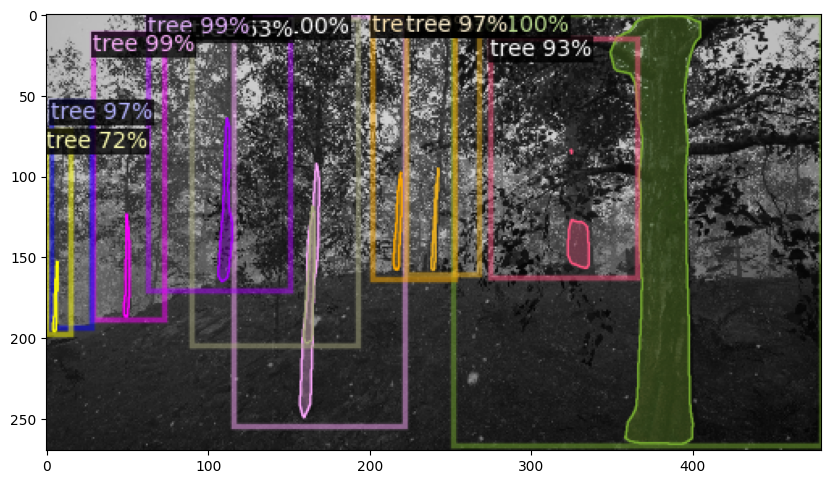

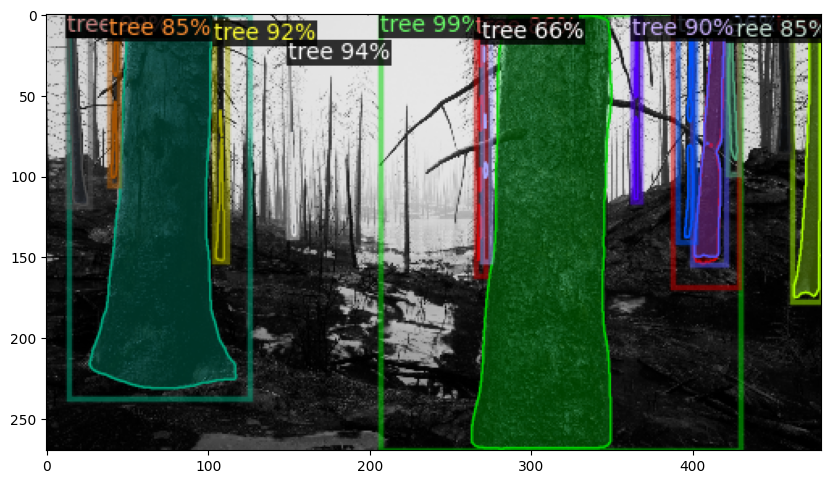

In [33]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

##### Check average precision and recall

In [34]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("spread_valid", output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "spread_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/14 11:25:59 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 10.58 seconds.
[01/14 11:25:59 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json
[01/14 11:25:59 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 126271       |
|            |              |
[01/14 11:25:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/14 11:25:59 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/14 11:25:59 d2.data.common]: Serializing 3042 elements to byte tensors and concatenating them all ...
[01/14 11:26:01 d2.data.common]: Serialized dataset takes 242.05 MiB
[01/14 11:26:01 d2.evaluation.evaluator]: Start inference on 3042 batches
[01/14 11:

[01/14 11:29:22 d2.evaluation.evaluator]: Total inference pure compute time: 0:02:41 (0.053148 s / iter per device, on 1 devices)
[01/14 11:29:23 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/14 11:29:23 d2.evaluation.coco_evaluation]: Saving results to /mnt/raid1/repos/maskdino/maskdino-output/mask_rcnn_R_101_DC5_3x/coco_instances_results.json
[01/14 11:29:23 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
[01/14 11:29:23 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[01/14 11:29:24 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.87 seconds.
[01/14 11:29:24 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/14 11:29:24 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.09 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.117
 Average Pre

**Load a new image and segment it.**

In [35]:
os.makedirs('/tmp/trees', exist_ok=True)

In [36]:
!wget 'https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg' --output-document='/tmp/trees/Forest-trees.jpg'

--2025-01-14 11:29:36--  https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg
Resolving www.sciencefriday.com (www.sciencefriday.com)... 192.0.66.159, 2a04:fa87:fffd::c000:429f
Connecting to www.sciencefriday.com (www.sciencefriday.com)|192.0.66.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2359367 (2.2M) [image/jpeg]
Saving to: ‘/tmp/trees/Forest-trees.jpg’

/tmp/trees/Forest-t 100%[===================>]   2.25M  10.0MB/s    in 0.2s    

2025-01-14 11:29:36 (10.0 MB/s) - ‘/tmp/trees/Forest-trees.jpg’ saved [2359367/2359367]



In [37]:
def detectron2_predict(fn):
    new_im = cv2.imread(fn)
    outputs  = predictor(new_im)

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])

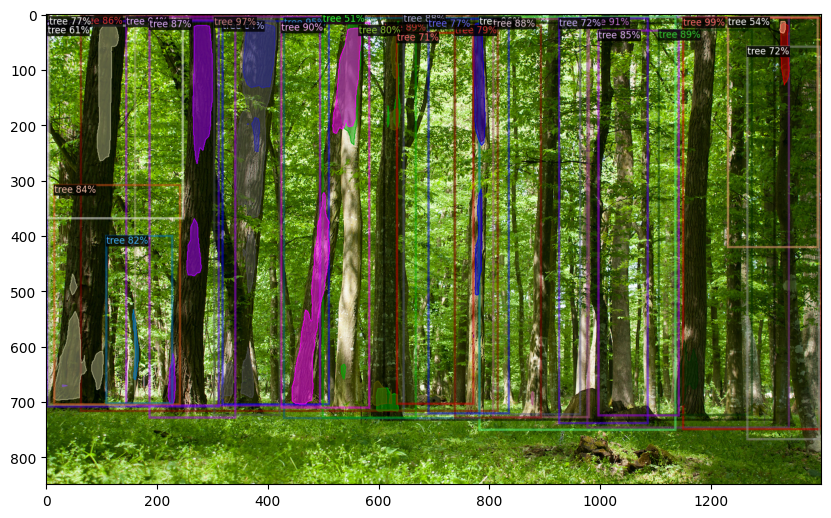

In [38]:
detectron2_predict(fn='/tmp/trees/Forest-trees.jpg')

--2025-01-14 11:29:39--  https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 668616 (653K) [image/jpeg]
Saving to: ‘/tmp/trees/black-forest-germany.jpg’

/tmp/trees/black-fo 100%[===================>] 652.95K  --.-KB/s    in 0.08s   

2025-01-14 11:29:39 (7.78 MB/s) - ‘/tmp/trees/black-forest-germany.jpg’ saved [668616/668616]



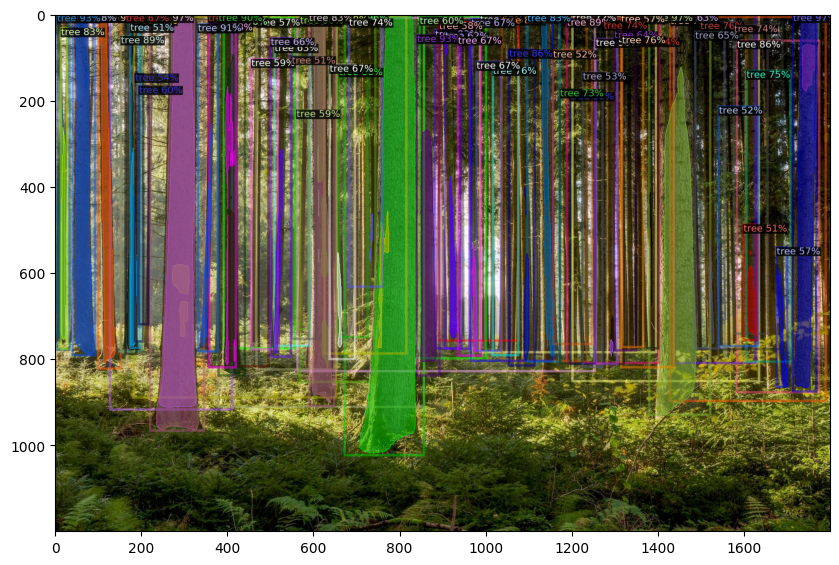

In [39]:
fn='/tmp/trees/black-forest-germany.jpg'
!wget 'https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 11:29:41--  https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519362 (507K) [image/jpeg]
Saving to: ‘/tmp/trees/forest-in-the-rain.webp’

/tmp/trees/forest-i 100%[===================>] 507.19K  --.-KB/s    in 0.08s   

2025-01-14 11:29:41 (6.04 MB/s) - ‘/tmp/trees/forest-in-the-rain.webp’ saved [519362/519362]



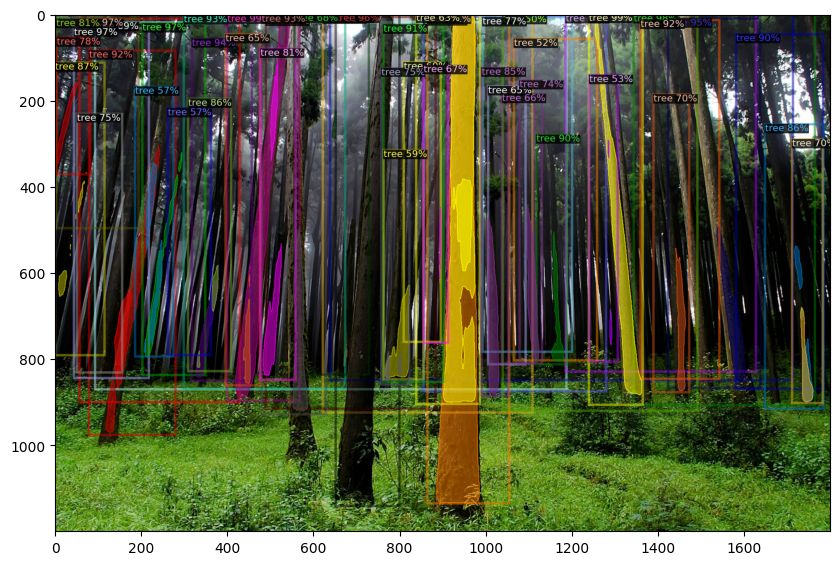

In [40]:
fn='/tmp/trees/forest-in-the-rain.webp'
!wget 'https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 11:29:42--  https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg
Resolving www.nycgovparks.org (www.nycgovparks.org)... 34.200.3.35, 98.85.75.120, 34.228.163.119
Connecting to www.nycgovparks.org (www.nycgovparks.org)|34.200.3.35|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2057733 (2.0M) [image/jpeg]
Saving to: ‘/tmp/trees/great-trees-in-nyc.jpg’

/tmp/trees/great-tr 100%[===================>]   1.96M  1.80MB/s    in 1.1s    

2025-01-14 11:29:44 (1.80 MB/s) - ‘/tmp/trees/great-trees-in-nyc.jpg’ saved [2057733/2057733]



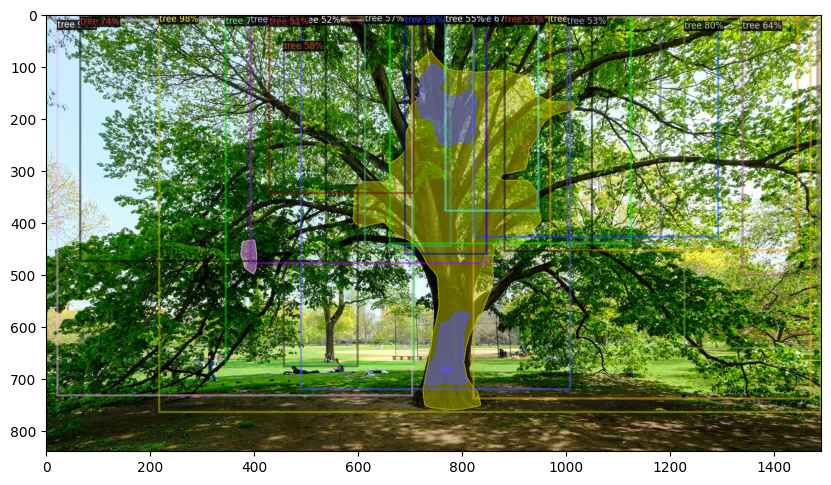

In [41]:
fn='/tmp/trees/great-trees-in-nyc.jpg'
!wget 'https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 11:29:45--  https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 151.101.64.238, 151.101.192.238, 151.101.128.238, ...
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|151.101.64.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 274501 (268K) [image/jpeg]
Saving to: ‘/tmp/trees/tree-in-winter.jpg’

/tmp/trees/tree-in- 100%[===================>] 268.07K  --.-KB/s    in 0.04s   

2025-01-14 11:29:45 (6.27 MB/s) - ‘/tmp/trees/tree-in-winter.jpg’ saved [274501/274501]



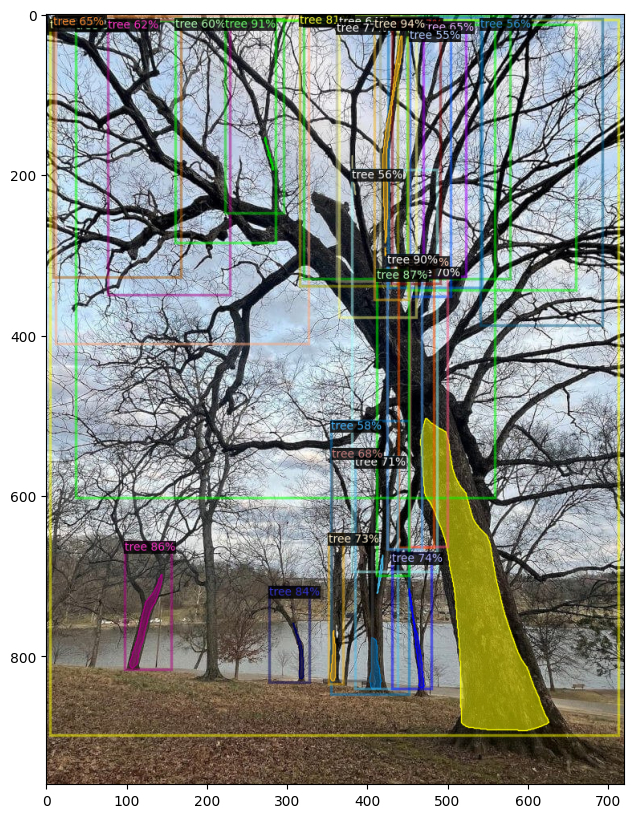

In [42]:
fn='/tmp/trees/tree-in-winter.jpg'
!wget 'https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 11:29:46--  https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg
Resolving www.arboroperations.com.au (www.arboroperations.com.au)... 54.253.233.167
Connecting to www.arboroperations.com.au (www.arboroperations.com.au)|54.253.233.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1076645 (1.0M) [image/jpeg]
Saving to: ‘/tmp/trees/american-elm.jpg’

/tmp/trees/american 100%[===================>]   1.03M   513KB/s    in 2.1s    

2025-01-14 11:29:50 (513 KB/s) - ‘/tmp/trees/american-elm.jpg’ saved [1076645/1076645]



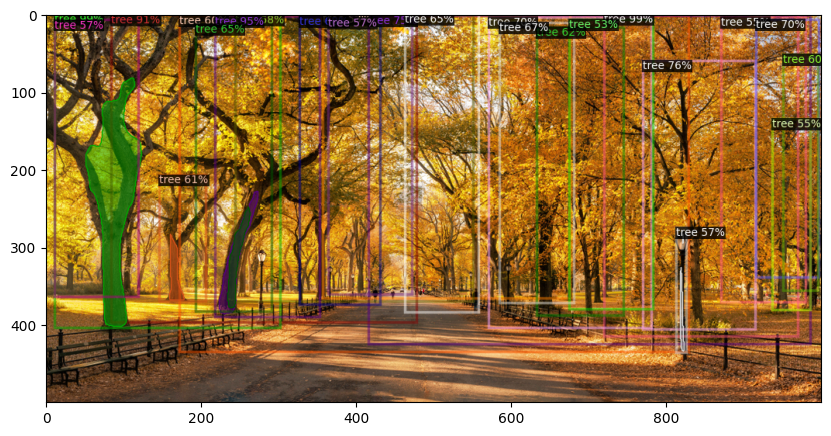

In [43]:
fn='/tmp/trees/american-elm.jpg'
!wget --user-agent='Mozilla 5.0' 'https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-14 11:29:51--  https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg
Resolving mothertreeproject.org (mothertreeproject.org)... 198.50.124.194
Connecting to mothertreeproject.org (mothertreeproject.org)|198.50.124.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 686185 (670K) [image/jpeg]
Saving to: ‘/tmp/trees/large-trees.jpg’

/tmp/trees/large-tr 100%[===================>] 670.10K   600KB/s    in 1.1s    

2025-01-14 11:29:52 (600 KB/s) - ‘/tmp/trees/large-trees.jpg’ saved [686185/686185]



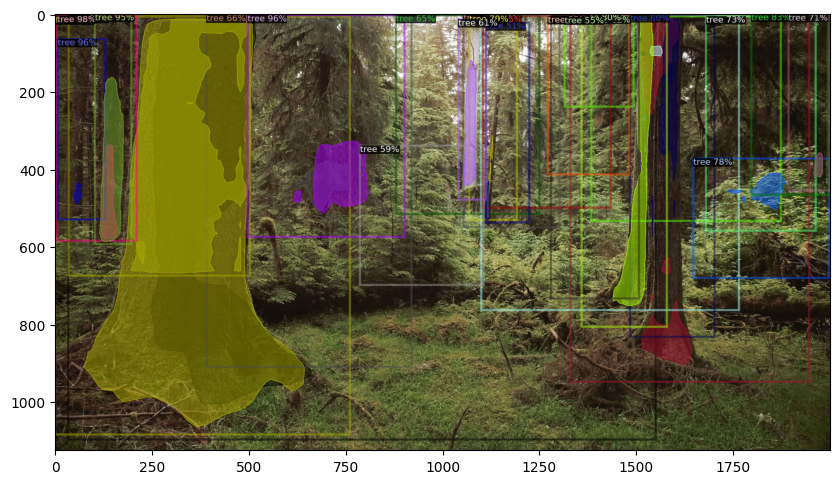

In [44]:
fn='/tmp/trees/large-trees.jpg'
!wget 'https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg' --output-document={fn}
detectron2_predict(fn=fn)

**Process multiple images in a directory and save the results in an output directory**

In [45]:
# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results"  # Replace this with the path to your desired output directory
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.



**Segment images and save object level information into a csv file.**




In [46]:
import csv
from skimage.measure import regionprops, label


# Assuming you have already defined the 'predictor' object and loaded the model.
# Also, make sure 'metadata' is defined appropriately.

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
output_csv_path  = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Open the CSV file for writing
with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write the header row in the CSV file
    csvwriter.writerow(["File Name", "Class Name", "Object Number", "Area", "Centroid", "BoundingBox"])  # Add more columns as needed for other properties

    # Loop over the images in the input folder
    for image_filename in os.listdir(input_images_directory):
        image_path = os.path.join(input_images_directory, image_filename)
        if os.path.isdir(image_path):
            continue
        print(f'Reading image: {image_path}')
        new_im = cv2.imread(image_path)

        # Perform prediction on the new image
        outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Convert the predicted mask to a binary mask
        mask = outputs["instances"].pred_masks.to("cpu").numpy().astype(bool)

        # Get the predicted class labels
        class_labels = outputs["instances"].pred_classes.to("cpu").numpy()

        # Debugging: print class_labels and metadata.thing_classes
        #print("Class Labels:", class_labels)
        #print("Thing Classes:", train_metadata.thing_classes)

        # Use skimage.measure.regionprops to calculate object parameters
        labeled_mask = label(mask)
        props = regionprops(labeled_mask)

        # Write the object-level information to the CSV file
        for i, prop in enumerate(props):
            object_number = i + 1  # Object number starts from 1
            area = prop.area
            centroid = prop.centroid
            bounding_box = prop.bbox

            # Check if the corresponding class label exists
            if i < len(class_labels):
                class_label = class_labels[i]
                class_name = train_metadata.thing_classes[class_label]
            else:
                # If class label is not available (should not happen), use 'Unknown' as class name
                class_name = 'Unknown'

            # Write the object-level information to the CSV file
            csvwriter.writerow([image_filename, class_name, object_number, area, centroid, bounding_box])  # Add more columns as needed for other properties

print("Object-level information saved to CSV file.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Object-level information saved to CSV file.


**Generate plots to understand the objects**

/tmp/ipykernel_2089892/3638285612.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)


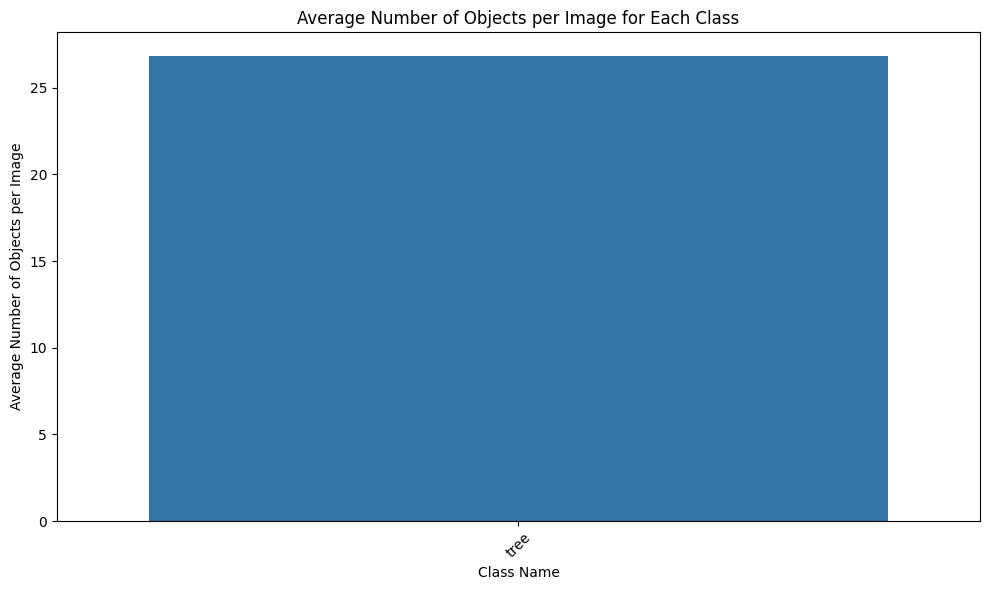

/tmp/ipykernel_2089892/3638285612.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)


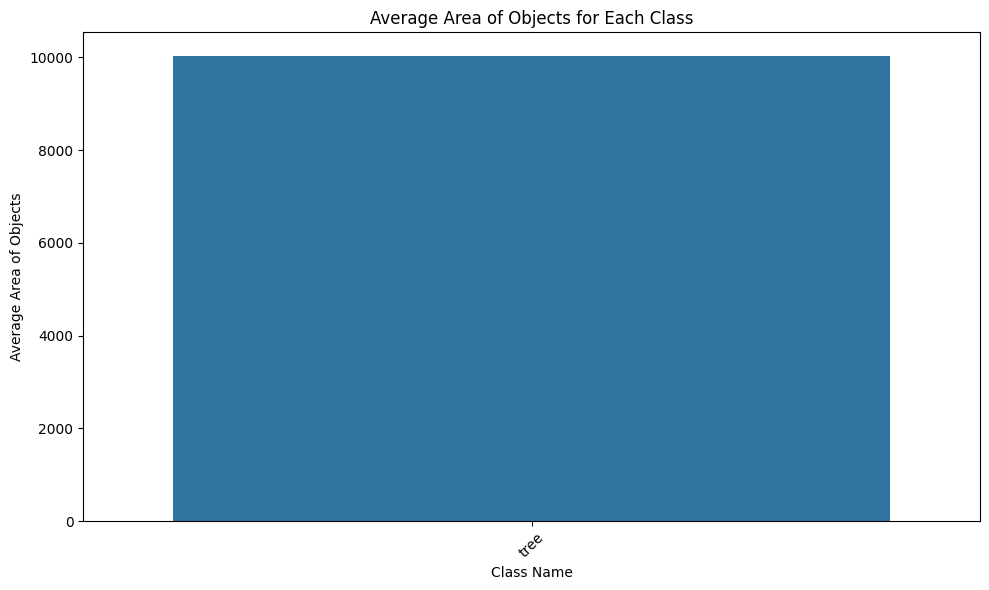

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
csv_file_path    = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Get class names from train_metadata.thing_classes
class_names = train_metadata.thing_classes

# Group the data by both "File Name" and "Class Name" and calculate the average number of objects per image for each class
# first group the data by both "File Name" and "Class Name" and count the number of objects within each group.
#Then, group the data by "Class Name" only and calculate the mean of the counts, which gives us the average number of objects per image for each class.
avg_objects_per_class = df.groupby(["File Name", "Class Name"])["Object Number"].count().reset_index()
avg_objects_per_class = avg_objects_per_class.groupby("Class Name")["Object Number"].mean().reset_index()

# Plot: Average number of objects per image for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Number of Objects per Image")
plt.title("Average Number of Objects per Image for Each Class")
plt.tight_layout()
plt.show()


# Group the data by class and calculate the average area of objects for each class
avg_area_per_class = df.groupby("Class Name")["Area"].mean().reset_index()

# Plot: Average area of objects for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Area of Objects")
plt.title("Average Area of Objects for Each Class")
plt.tight_layout()
plt.show()

**Saving binary (actually multinary) images for each class for further processing.** Here, for each input image we will save n images corresponding to the number of classes. In our example, we will save 4 images for each image corresponding to the 4 classes. Each of these images will contain objects numbered 1, 2, 3, etc. - basically instance segmentation like images. These images can be used for further downstream processing.

In [48]:
import os
import cv2
import numpy as np
import torch
from detectron2.utils.visualizer import Visualizer

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results/instances"
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Create a dictionary to store the mask for each class with unique integer labels
    class_masks = {class_name: torch.zeros_like(outputs["instances"].pred_masks[0], dtype=torch.uint8, device=torch.device("cuda:0"))
                   for class_name in train_metadata.thing_classes}

    # Assign a unique integer label to each object in the mask
    for i, pred_class in enumerate(outputs["instances"].pred_classes):
        class_name = train_metadata.thing_classes[pred_class]
        class_masks[class_name] = torch.where(outputs["instances"].pred_masks[i].to(device=torch.device("cuda:0")),
                                              i + 1,
                                              class_masks[class_name])

    # Save the masks for each class with unique integer labels
    for class_name, class_mask in class_masks.items():
        # Convert the tensor to a NumPy array and then to a regular (CPU) array
        class_mask_np = class_mask.cpu().numpy()

        # Create the output filename with _class_name_result.png extension
        class_filename = os.path.splitext(image_filename)[0] + f"_{class_name}_result.png"
        class_output_path = os.path.join(output_directory, class_filename)

        # Save the image with unique integer labels
        cv2.imwrite(class_output_path, class_mask_np.astype(np.uint8))

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.
